In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [20, 10]

In [2]:
def plot_array_of_images(values, path_to_write, f, func_to_apply):
    fig, axes = plt.subplots(2, 2)
    for i, value in enumerate(values):
        binary = f(value, func_to_apply)[:, :, 1]
        axes[i//2, i%2].imshow(binary, "gray")
        axes[i//2, i%2].set_title(f"{value}")
        axes[i//2, i%2].set_axis_off()
#         cv2.imwrite(f"{global_path}/{path_to_write}/cat_{value}.png", binary)
plt.show()

In [3]:
def get_fourier(channel):
    fft2 = np.fft.fft2(channel)
    f_bounded = fft2
    fft2 = np.fft.fftshift(fft2)
    f_bounded = 20 * np.log(abs(fft2) + 1)
    return f_bounded, fft2

In [4]:
global_path = "."
file_name = "cat"

In [5]:
class ImageAnalyser:
    def __init__(self, path_to_img):
        self.path_to_img = path_to_img
        self.colored_img = self.read()
        # needed as opencv read image in BGR format
        self.convert_from_bgr_to_rgb()
        self.gray_img = self.convert_img_to_gray().astype(np.uint8)
        self.fft2 = None
        self.duv = self.calc_duv()
        
    def calc_duv(self):
        m = self.gray_img.shape[0]
        n = self.gray_img.shape[1]

        # Создаем массивы строк и столбцов матрицы размера mxn
        rows, cols = np.ogrid[:m, :n]

        # Вычисляем расстояние от каждой точки до центра матрицы
        self.duv = np.sqrt((rows - m / 2) ** 2 + (cols - n / 2) ** 2)
        
        return self.duv

    # read image by path
    def read(self) -> np.ndarray:
        return cv2.imread(self.path_to_img)
    
    def convert_from_bgr_to_rgb(self):
        b, g, r = self.colored_img[:, :, 0], self.colored_img[:, :, 1], self.colored_img[:, :, 2]
        
        rgb_img = np.zeros_like(self.colored_img)
        rgb_img[:, :, 0] = r
        rgb_img[:, :, 1] = g
        rgb_img[:, :, 2] = b
        
        self.colored_img = rgb_img
        
    def convert_from_rgb_to_bgr(self):
        r, g, b = self.colored_img[:, :, 0], self.colored_img[:, :, 1], self.colored_img[:, :, 2]
        
        bgr_img = np.zeros_like(self.colored_img)
        bgr_img[:, :, 0] = b
        bgr_img[:, :, 1] = g
        bgr_img[:, :, 2] = r
        
        return bgr_img
        
    # converts image to grayscale
    def convert_img_to_gray(self) -> np.ndarray:
        r, g, b = self.colored_img[:, :, 0], self.colored_img[:, :, 1], self.colored_img[:, :, 2]
        gray_img = 0.2989 * r + 0.5870 * g + 0.1140 * b
        return gray_img
    
    def get_fourier(self, channel):
        self.fft2 = np.fft.fft2(channel)
        shift2center = np.fft.fftshift(fft2)
        return shift2center
    
    def filter_low_freq(self, fft, d0):
        final_fft = fft.copy()
        
        lower_freq_indexes = np.where(self.duv > d0)
        final_fft[lower_freq_indexes[0], lower_freq_indexes[1]] = 0
        
        return final_fft
    
    def filter_high_freq(self, fft, d0):
        final_fft = fft.copy()
        
        lower_freq_indexes = np.where(self.duv < d0)
        final_fft[lower_freq_indexes[0], lower_freq_indexes[1]] = 0
        
        return final_fft
    
    def get_filtered(self, channel, d0, func_to_filter):
        test_img = channel.copy()
        
        # test_img = np.fft.fftshift(test_img)

        fft2_of_test_img = np.fft.fft2(test_img)
    
        fft2_of_test_img = np.fft.fftshift(fft2_of_test_img)
        
        fft2_of_test_img = func_to_filter(fft2_of_test_img, d0)

        f_bounded = 20 * np.log(abs(fft2_of_test_img) + 1)
                
        fft2_of_test_img = np.fft.fftshift(fft2_of_test_img)
        
        img = np.fft.ifft2(fft2_of_test_img)

        # img = np.fft.fftshift(abs(img))
        
        return np.abs(img)
    
    def get_filltered_by_low_pass(self, channel, d0):
        return self.get_filtered(channel, d0, self.filter_low_freq)
    
    def get_filltered_by_high_pass(self, channel, d0):
        return self.get_filtered(channel, d0, self.filter_high_freq)
    
    def get_filtered_by_batterwort_low(self, channel, d0):
        return self.get_filtered(channel, d0, self.batterwort_filter).astype(np.uint8)
    
    def get_filtered_by_batterwort_high(self, channel, d0):
        return self.get_filtered(channel, d0, self.batterwort_filter_high).astype(np.uint8)
    
    def get_filtered_by_gauss_low(self, channel, d0):
        return self.get_filtered(channel, d0, self.gauss_filter_low).astype(np.uint8)
    
    def get_filtered_by_gauss_high(self, channel, d0):
        return self.get_filtered(channel, d0, self.gauss_filter_high).astype(np.uint8)
    
    def get_filltered3_channel(self, d0, f):
        r = f(self.colored_img[:, :, 0], d0)
        g = f(self.colored_img[:, :, 1], d0)
        b = f(self.colored_img[:, :, 2], d0)

        return np.uint8(cv2.merge((r,g,b)))
    
    def batterwort_filter(self, fft_of_test_img, d0, n=2):
        fft = fft_of_test_img.copy()
        
        huv = 1 / (np.power(self.duv / d0, 2 * n) + 1)
        
        out = fft * huv
        
        return out
    
    def batterwort_filter_high(self, fft_of_test_img, d0, n=2):
        fft = fft_of_test_img.copy()
        
        huv = 1 / (np.power(d0 / self.duv, 2 * n) + 1)
        
        out = fft * huv
        
        return out
    
    def gauss_filter_low(self, fft_of_test_img, d0, n=2):
        fft = fft_of_test_img.copy()
        
        huv = np.exp(-np.power(self.duv, 2) / (2 * d0 ** 2))
        
        out = fft * huv
        
        return out
    
    def gauss_filter_high(self, fft_of_test_img, d0, n=2):
        fft = fft_of_test_img.copy()
        
        huv = 1 - np.exp(-np.power(self.duv, 2) / (2 * d0 ** 2))
        
        out = fft * huv
        
        return out
        
image_analyser = ImageAnalyser(f"{global_path}/{file_name}.jpg")
image_analyser2 = ImageAnalyser(f"/home/julia/Downloads/Telegram Desktop/DIP/lab4/1.png")

Fourier transform and spuctrim

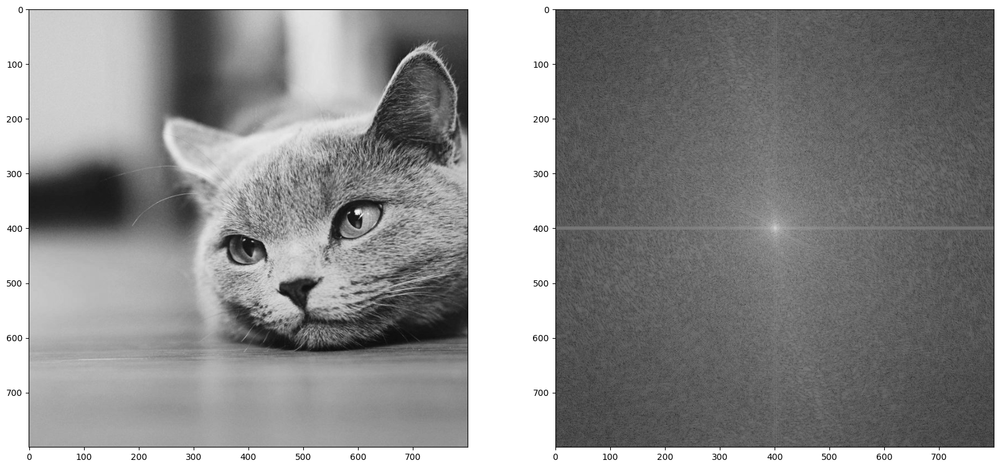

In [6]:
fft2 = np.fft.fft2(image_analyser.gray_img)
shift2center = np.fft.fftshift(fft2)
log_shift2center = np.log(1 + np.abs(shift2center))

fig, axes = plt.subplots(1, 2)
axes[0].imshow(image_analyser.gray_img, 'gray')
axes[1].imshow(log_shift2center, 'gray')

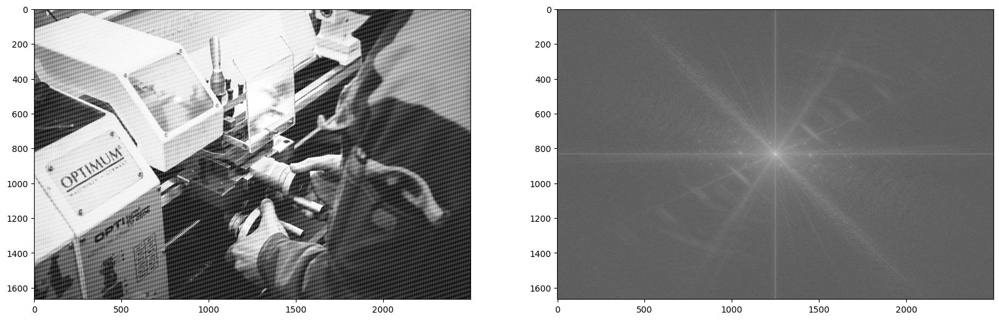

In [7]:
fft2 = np.fft.fft2(image_analyser2.gray_img)
shift2center = np.fft.fftshift(fft2)
log_shift2center = np.log(1 + np.abs(shift2center))

fig, axes = plt.subplots(1, 2)
axes[0].imshow(image_analyser2.gray_img, 'gray')
axes[1].imshow(log_shift2center, 'gray')

### 2 Filters

Low pass filter

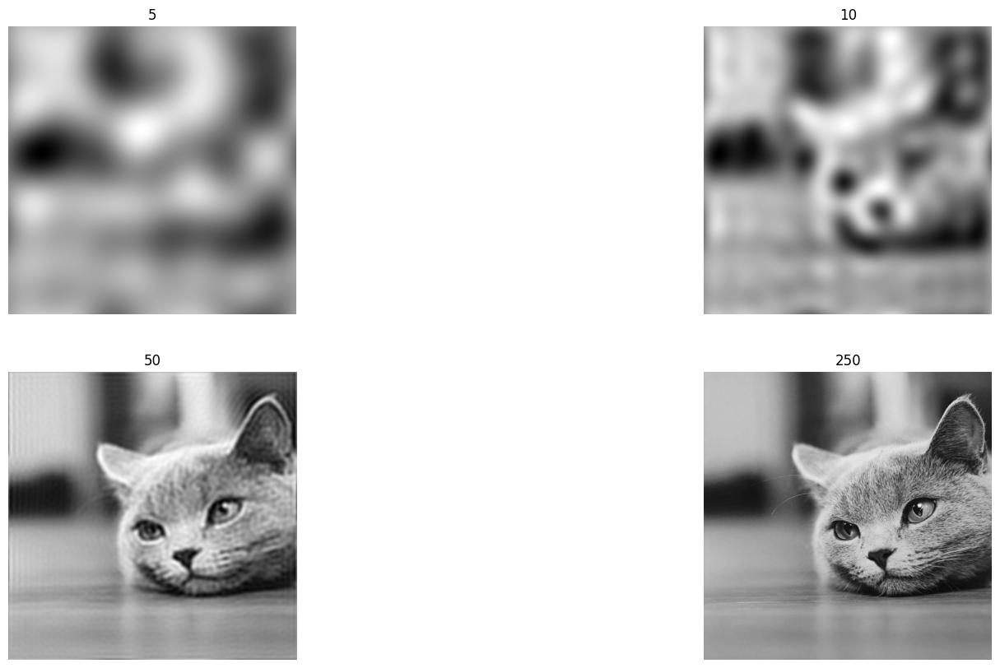

In [8]:
plot_array_of_images([5, 10, 50, 250], 
                     ".",
                     image_analyser.get_filltered3_channel, 
                     image_analyser.get_filltered_by_low_pass)

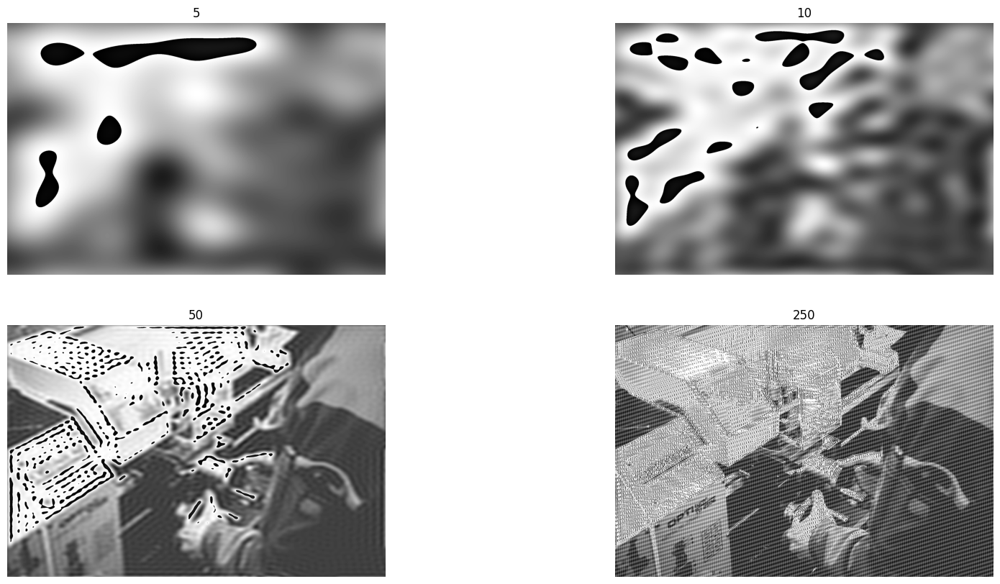

In [9]:
plot_array_of_images([5, 10, 50, 250], 
                     ".", 
                     image_analyser2.get_filltered3_channel,
                     image_analyser2.get_filltered_by_low_pass)

Batterwort filter

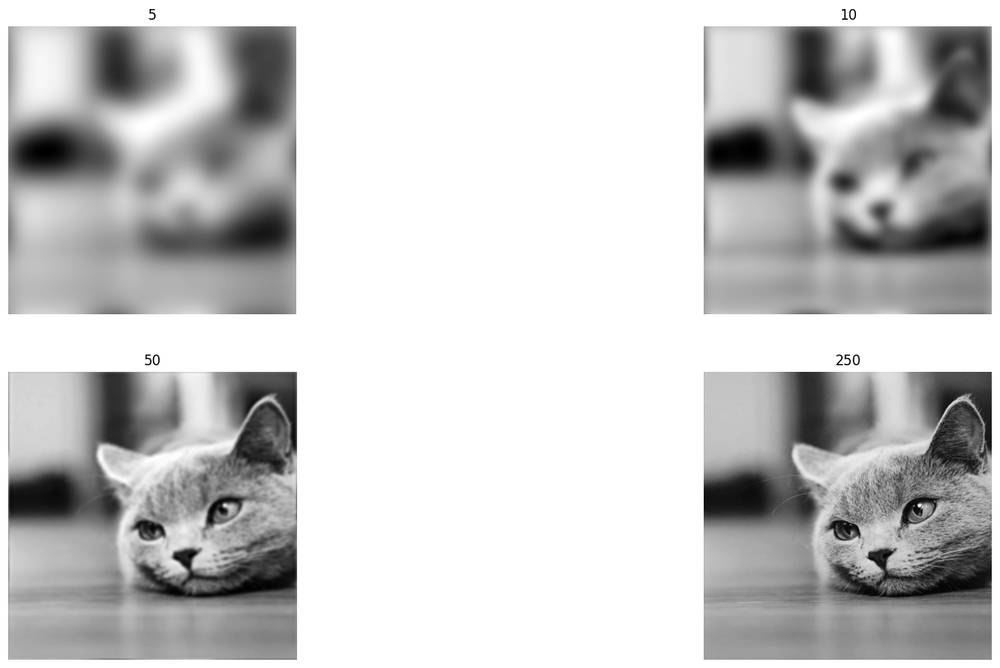

In [10]:
plot_array_of_images([5, 10, 50, 250],
                     ".",
                     image_analyser.get_filltered3_channel, 
                     image_analyser.get_filtered_by_batterwort_low)

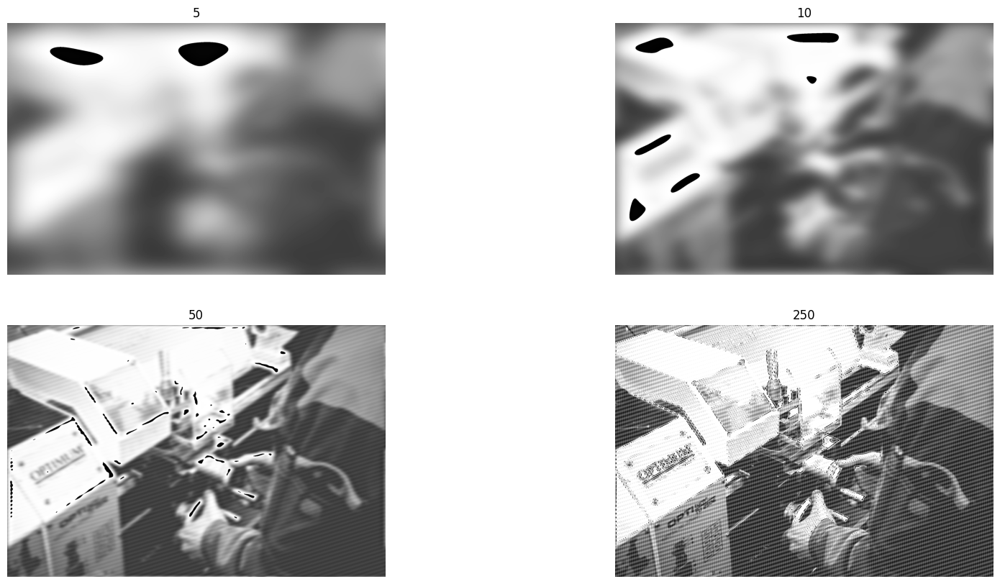

In [11]:
plot_array_of_images([5, 10, 50, 250],
                     ".",
                     image_analyser2.get_filltered3_channel, 
                     image_analyser2.get_filtered_by_batterwort_low)

Gauss

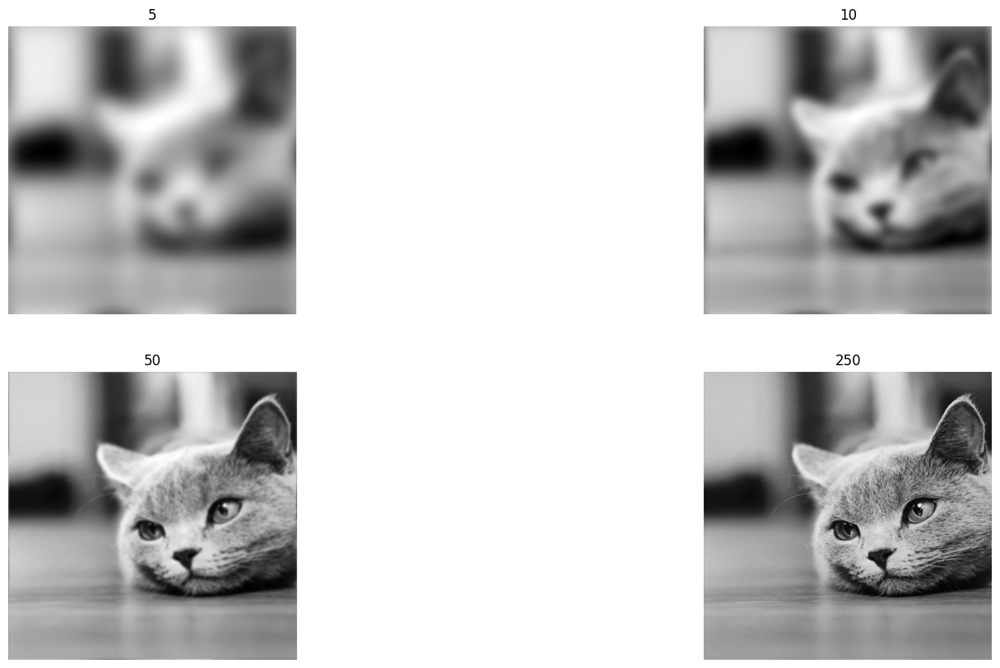

In [12]:
plot_array_of_images([5, 10, 50, 250],
                     ".",
                     image_analyser.get_filltered3_channel, 
                     image_analyser.get_filtered_by_gauss_low)

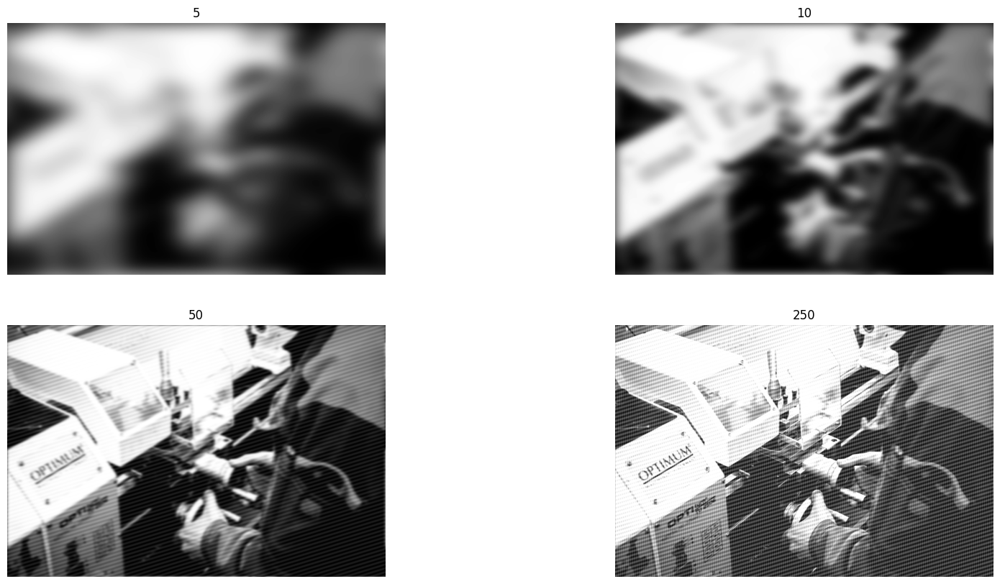

In [13]:
plot_array_of_images([5, 10, 50, 250],
                     ".",
                     image_analyser2.get_filltered3_channel, 
                     image_analyser2.get_filtered_by_gauss_low)

### 3 High

High pass filter

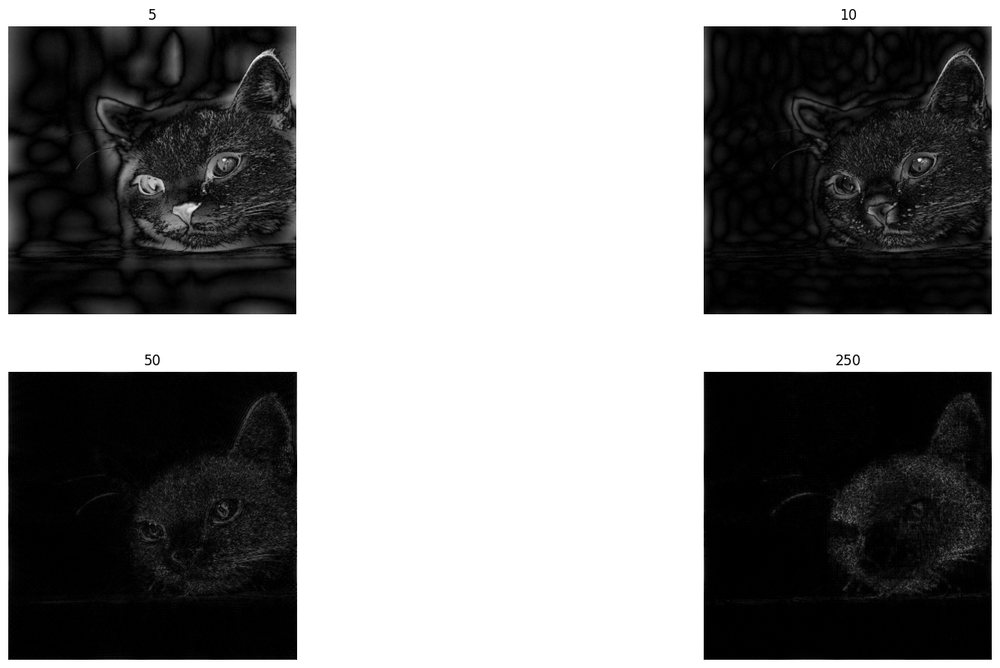

In [14]:
plot_array_of_images([5, 10, 50, 250], 
                     ".", 
                     image_analyser.get_filltered3_channel,
                     image_analyser.get_filltered_by_high_pass)

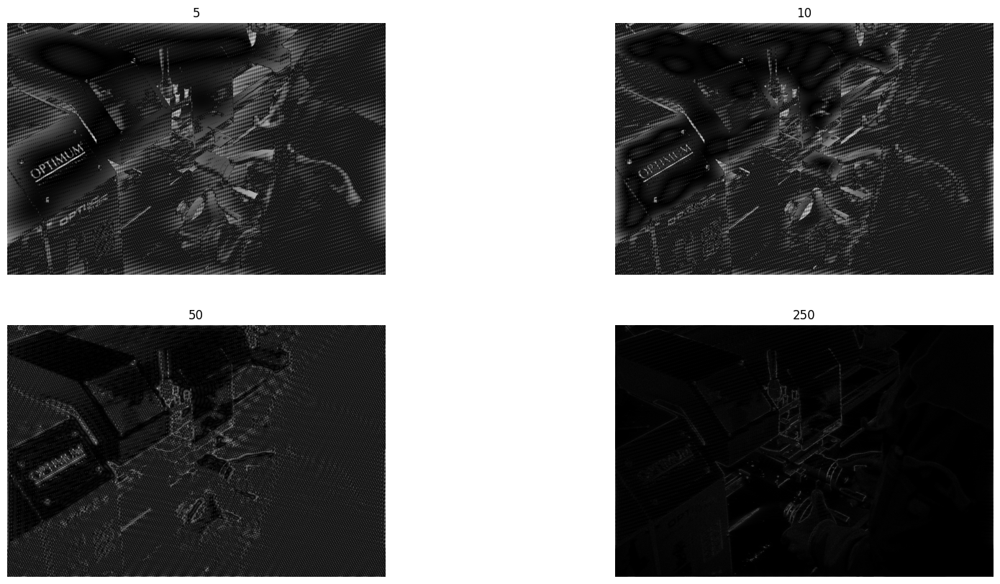

In [15]:
plot_array_of_images([5, 10, 50, 250], 
                     ".", 
                     image_analyser2.get_filltered3_channel,
                     image_analyser2.get_filltered_by_high_pass)

Batterwot

/tmp/ipykernel_10488/975813656.py:132: RuntimeWarning: divide by zero encountered in true_divide
  huv = 1 / (np.power(d0 / self.duv, 2 * n) + 1)


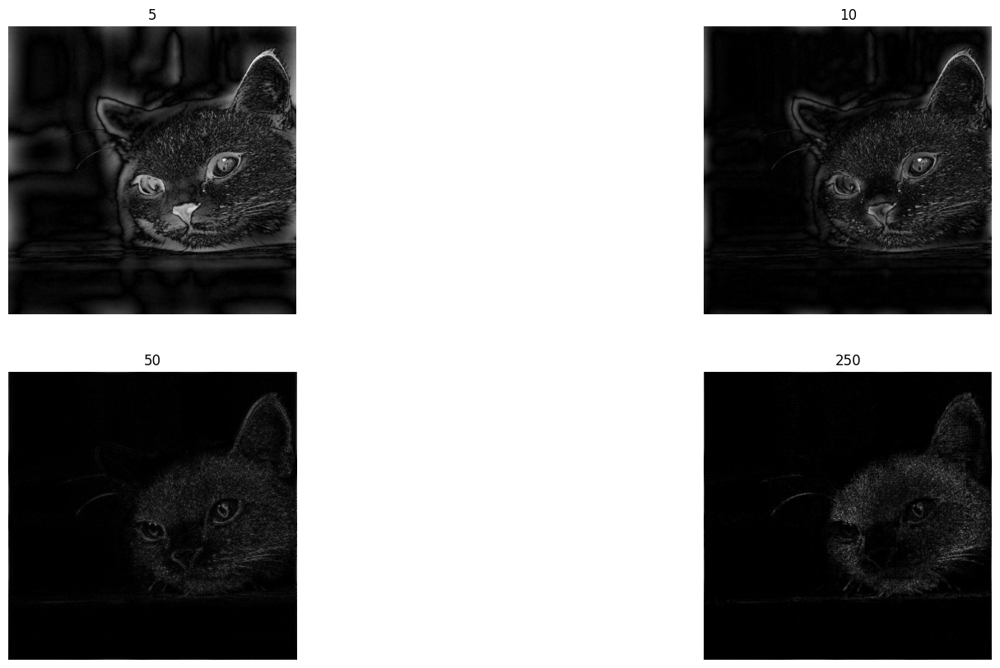

In [16]:
plot_array_of_images([5, 10, 50, 250],
                     ".",
                     image_analyser.get_filltered3_channel, 
                     image_analyser.get_filtered_by_batterwort_high)

/tmp/ipykernel_10488/975813656.py:132: RuntimeWarning: divide by zero encountered in true_divide
  huv = 1 / (np.power(d0 / self.duv, 2 * n) + 1)


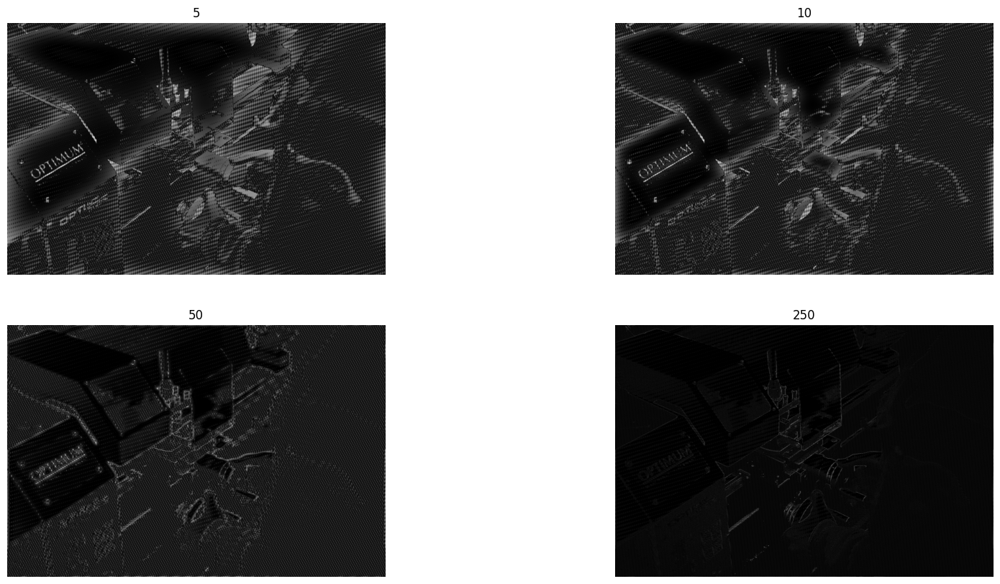

In [17]:
plot_array_of_images([5, 10, 50, 250],
                     ".",
                     image_analyser2.get_filltered3_channel, 
                     image_analyser2.get_filtered_by_batterwort_high)

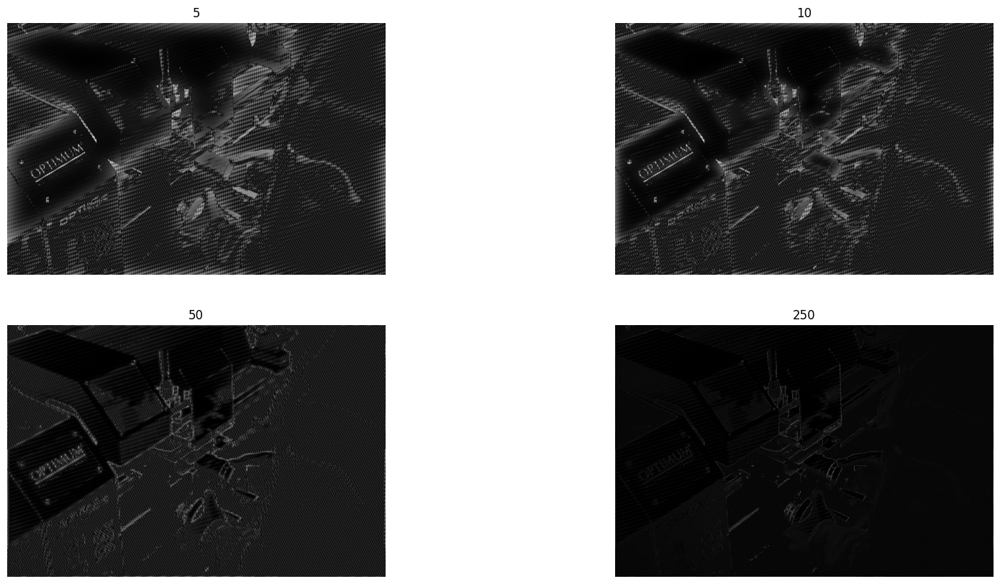

In [18]:
plot_array_of_images([5, 10, 50, 250],
                     ".",
                     image_analyser2.get_filltered3_channel, 
                     image_analyser2.get_filtered_by_gauss_high)

### Selective filtering

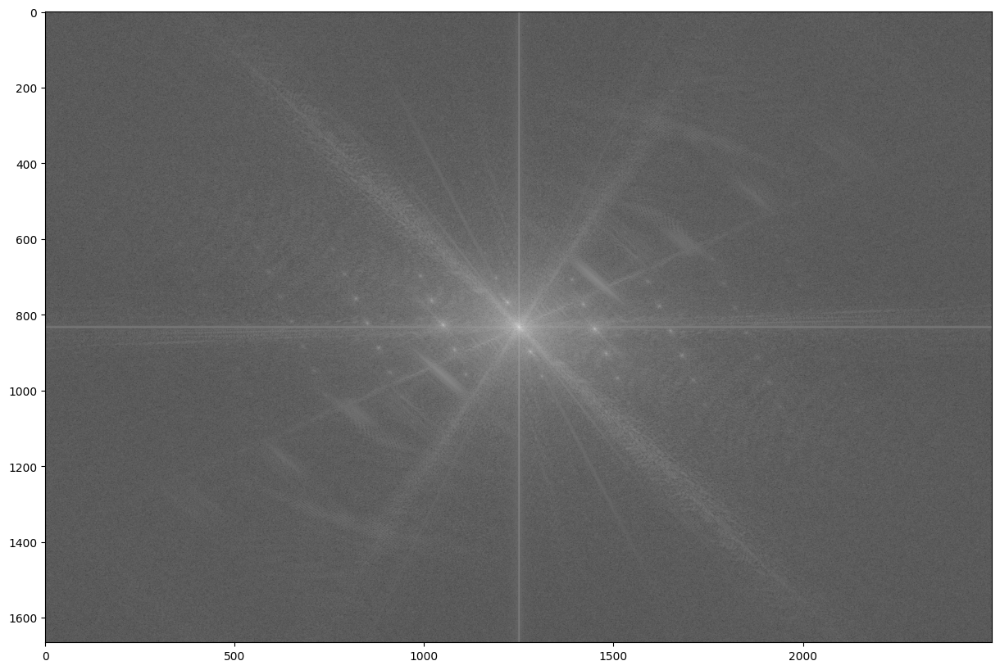

In [19]:
imput_img = image_analyser2.colored_img[:, :, 1]

fft2 = np.fft.fft2(imput_img)
fft2 = np.fft.fftshift(fft2)

f_bounded = 20 * np.log(abs(fft2) + 1)

plt.imshow(abs(f_bounded), "gray")

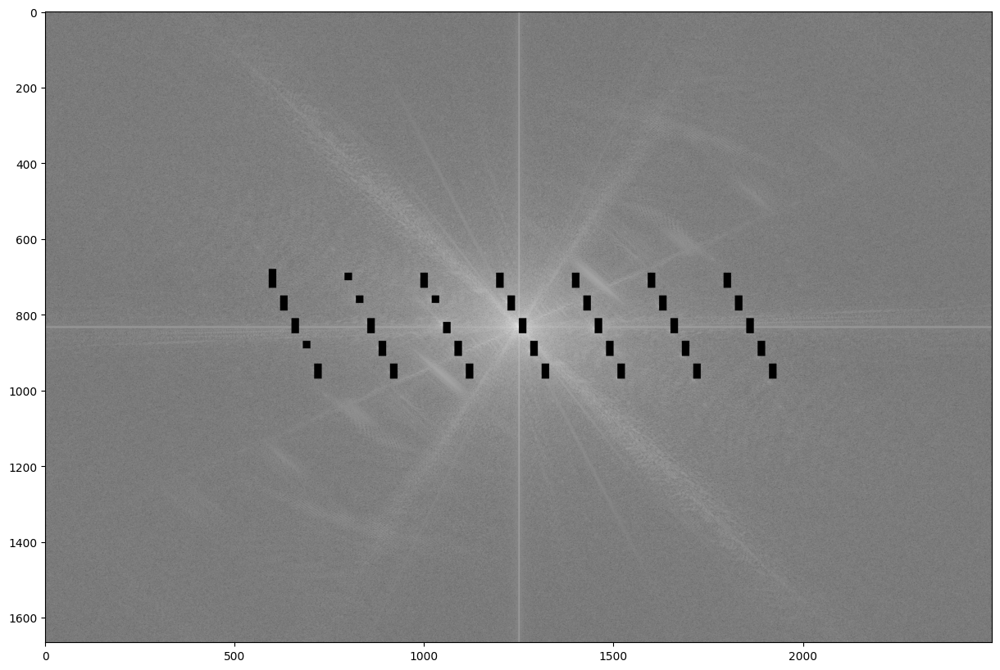

In [20]:
imput_img = image_analyser2.colored_img[:, :, 1]

fft2 = np.fft.fft2(imput_img)
fft2 = np.fft.fftshift(fft2)

# f_bounded = 20 * np.log(abs(fft2) + 1)

fft2[680:730, 590:610] = 0
fft2[750:790, 620:640] = 0
fft2[810:850, 650:670] = 0
fft2[870:890, 680:700] = 0
fft2[930:970, 710:730] = 0

fft2[690:710, 790:810] = 0
fft2[750:770, 820:840] = 0
fft2[810:850, 850:870] = 0
fft2[870:910, 880:900] = 0
fft2[930:970, 910:930] = 0

fft2[690:730, 990:1010] = 0
fft2[750:770, 1020:1040] = 0
fft2[820:850, 1050:1070] = 0
fft2[870:910, 1080:1100] = 0
fft2[930:970, 1110:1130] = 0

fft2[690:730, 1190:1210] = 0
fft2[750:790, 1220:1240] = 0
fft2[810:850, 1250:1270] = 0
fft2[870:910, 1280:1300] = 0
fft2[930:970, 1310:1330] = 0

fft2[690:730, 1390:1410] = 0
fft2[750:790, 1420:1440] = 0
fft2[810:850, 1450:1470] = 0
fft2[870:910, 1480:1500] = 0
fft2[930:970, 1510:1530] = 0

fft2[690:730, 1590:1610] = 0
fft2[750:790, 1620:1640] = 0
fft2[810:850, 1650:1670] = 0
fft2[870:910, 1680:1700] = 0
fft2[930:970, 1710:1730] = 0

fft2[690:730, 1790:1810] = 0
fft2[750:790, 1820:1840] = 0
fft2[810:850, 1850:1870] = 0
fft2[870:910, 1880:1900] = 0
fft2[930:970, 1910:1930] = 0

f_bounded = 20 * np.log(abs(fft2) + 1)

fft2 = np.fft.fftshift(fft2)
out_img = np.fft.ifft2(fft2)

fft2 = np.fft.fft2(out_img)
fft2 = np.fft.fftshift(fft2)
f_bounded = 20 * np.log(abs(fft2) + 1)

plt.imshow(abs(f_bounded), "gray")

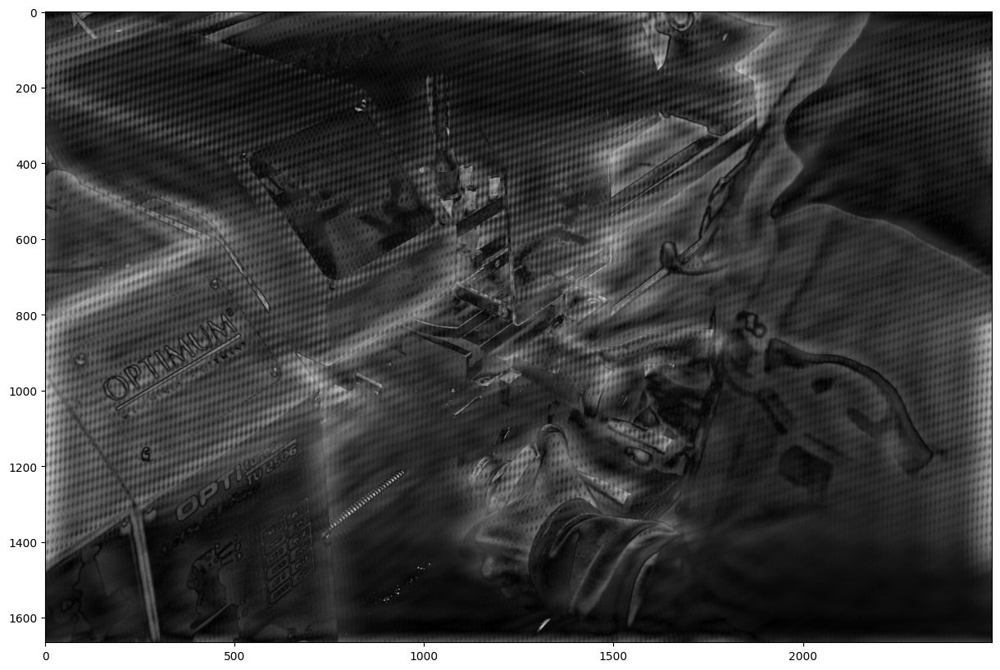

In [21]:
plt.imshow(abs(out_img), "gray")

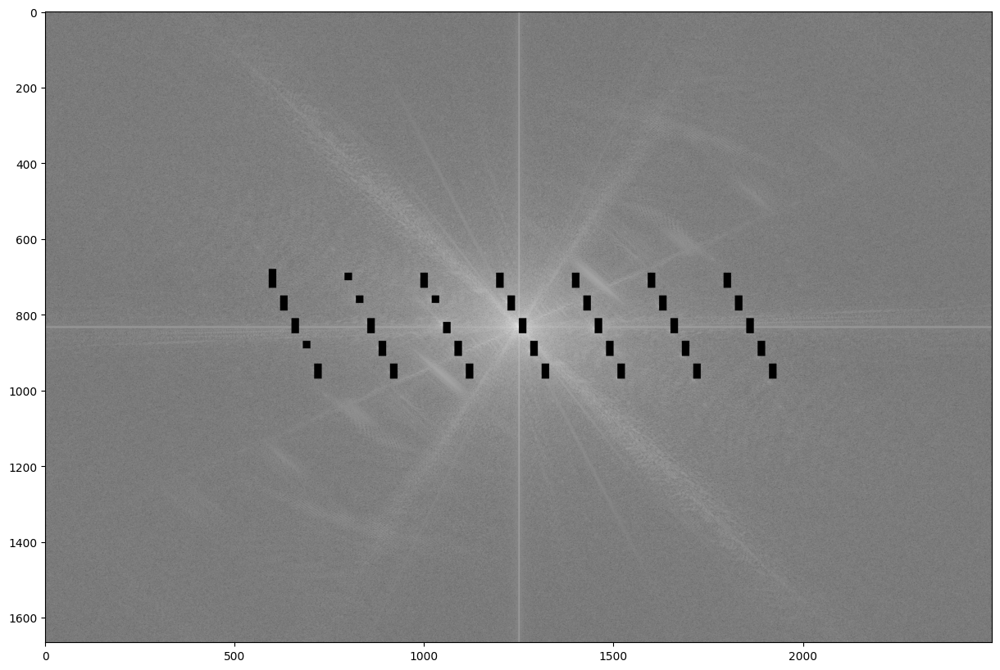

In [22]:
pout_img = abs(out_img)

fft2 = np.fft.fft2(out_img)
fft2 = np.fft.fftshift(fft2)
f_bounded = 20 * np.log(abs(fft2) + 1)

plt.imshow(f_bounded, "gray")

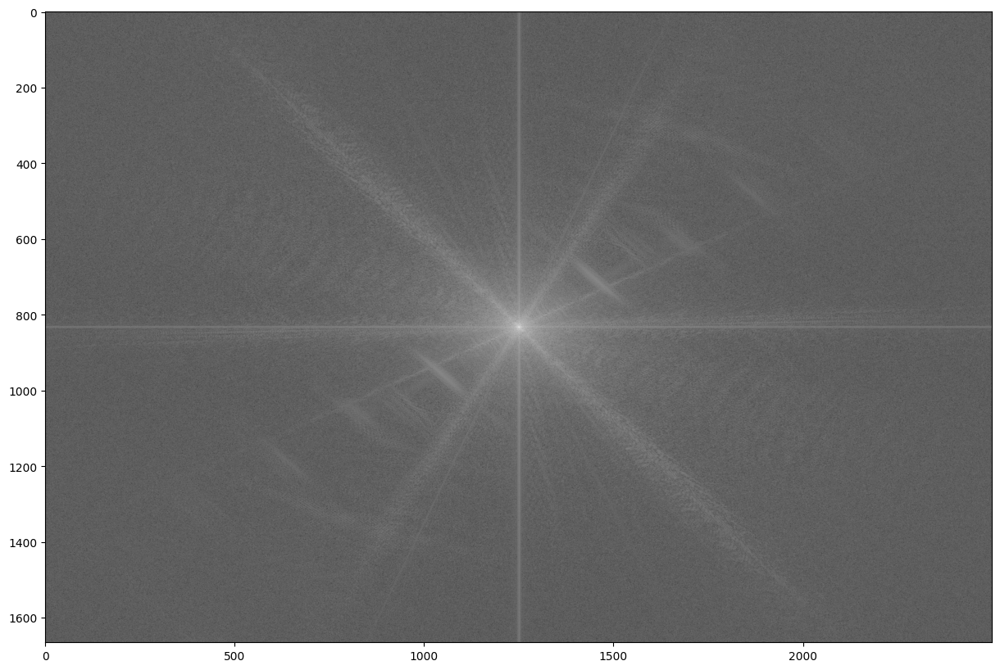

In [23]:
imput_img = image_analyser2.colored_img[:, :, 0]

fft2 = np.fft.fft2(imput_img)
fft2 = np.fft.fftshift(fft2)

f_bounded = 20 * np.log(abs(fft2) + 1)

plt.imshow(abs(f_bounded), "gray")